In [264]:
import osmnx as ox
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML
from tqdm import tqdm
import warnings
import time

In [265]:
warnings.filterwarnings("ignore")

start_time e end_time serviranno alla fine per il tempo di computazione

In [266]:
start_time = time.time()

In [267]:
end_time = time.time()

print(f'time total = {end_time - start_time}s')

time total = 0.02776360511779785s


Function computing global efficiency of the entire graph

In [268]:
def global_efficiency(graph):
    nodes, edges = ox.graph_to_gdfs(graph, nodes=True, edges=True)
    efficiency = 0
    efficiency_euclid = 0
    N = len(graph.nodes)
    for i in range(N):
        for j in range(N):
            if i!=j:
                if graph.has_edge(i,j):
                    d_ij = nx.shortest_path_length(G, i, j, weight='length')
                    efficiency += 1 / d_ij
                    #euclid_distance = (2*np.pi*6371000*ox.distance.euclidean(nodes['lat'][i],nodes['lon'][i],nodes['lat'][j],nodes['lon'][j]))/360
                    #efficiency_euclid += 1 / euclid_distance
                    global_efficiency = efficiency/(N*(N-1))
    return global_efficiency

Function that simulates cars through the city

Function setting velocity limit in a given number of streets

In [269]:
def set_max_speed(graph,street_names, max_speed : int):
    '''street_names : array of strings with streets names
        max_speed : in Km/h
    '''
    for _,_,data in graph.edges(data=True):
        if 'name' in data:
            if data['name'] in street_names:
                data['maxspeed'] = max_speed
                    
        #set automatically the new travelling time
        data['travelling_time'] = data['length']*3.6 / float(data['maxspeed'])

Function setting velocity limit in every street

In [270]:
def set_max_speed_all(graph,max_speed):
    '''max_speed : in Km/h'''
    for _,_,data in graph.edges(data=True):
        data['maxspeed'] = max_speed

        #set automatically the new travelling time
        data['travelling_time'] = data['length']*3.6 / float(data['maxspeed'])

Function fixing bugs of Osmnx edges data and setting travelling times (sometimes maxspeed of edges is a string or a list of strings)

<div style="color: red; font-weight:bold"> 
Needs to be runned before others when initializing graph!
</div> 

In [271]:
def set_travelling_times(graph):
    #function fixing bugs in graph.edges and setting travelling time, NEEDS TO BE RUNNED AS FIRST!!!!!
    for _,_,data in graph.edges(data=True):
        if 'maxspeed' not in data:
            data['maxspeed'] = 30.0
        if type(data['maxspeed']) == list:
            data['maxspeed'] = 30.0
        data['travelling_time'] = data['length']*3.6 / float(data['maxspeed'])

Function to add an attribute to edges 'passage', it will be updated when a car is passing through an edge

In [272]:
def set_passage_attribute_to_zero(graph):
    for _,_,data in graph.edges(data=True):
        data['passage'] = 0

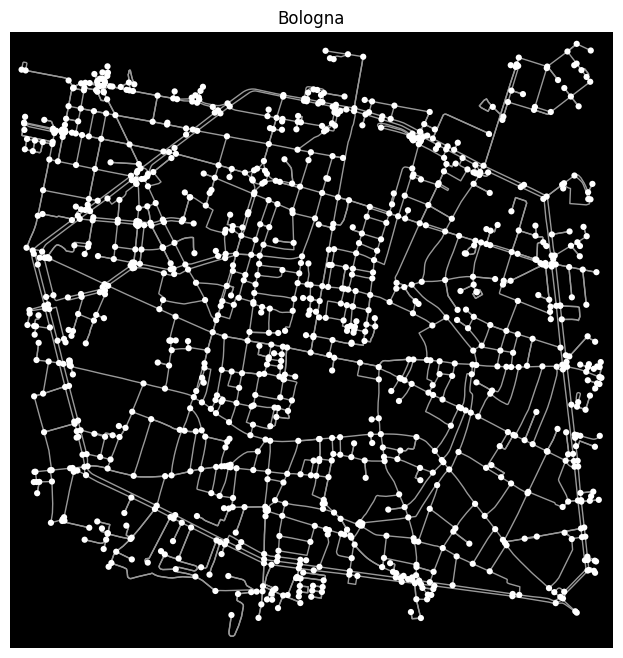

In [273]:
location_point = (44.495555, 11.3428)
Bologna_radius = 1300
# create network from point, inside bounding box of N, S, E, W each 750m from point
G = ox.graph_from_point(location_point, dist=Bologna_radius, dist_type='bbox', network_type='drive_service', simplify = True)
G = ox.project_graph(G)
osmids = list(G.nodes)
G = nx.relabel.convert_node_labels_to_integers(G)

# give each node its original osmid as attribute since we relabeled them
osmid_values = {k: v for k, v in zip(G.nodes, osmids)}
nx.set_node_attributes(G, osmid_values, "osmid")


fig, ax = ox.plot.plot_graph(G, bgcolor='black',node_size=20, node_color='white', show=False)
plt.axis('on')
plt.title('Bologna')
plt.show()

#inizializing some useful graph attributes
set_travelling_times(G)
set_passage_attribute_to_zero(G)

In [274]:
#connectivity analysis
n_edges = G.number_of_edges()
n_nodes = G.number_of_nodes()

#meshedness coefficient
alpha = (n_edges - n_nodes + 1) / (2 * n_nodes - 5)

#connectivity
beta = n_edges/n_nodes

# gammaindex is a measure of the relation between the real number of edges and the number of all possible edges in a network
gamma = n_edges/(3*(n_nodes-2))

#characteristic path length
#l_geo = nx.average_shortest_path_length(G)

#print results
print('# Edges: ', n_edges)
print('# Nodes: ', n_nodes)
print("meshedness coefficient:", alpha)
print("beta connectivity:", beta)
print("gamma index", gamma)
#print("characteristic path length:", l_geo)


# Edges:  2113
# Nodes:  1165
meshedness coefficient: 0.40817204301075266
beta connectivity: 1.813733905579399
gamma index 0.6056176554886787


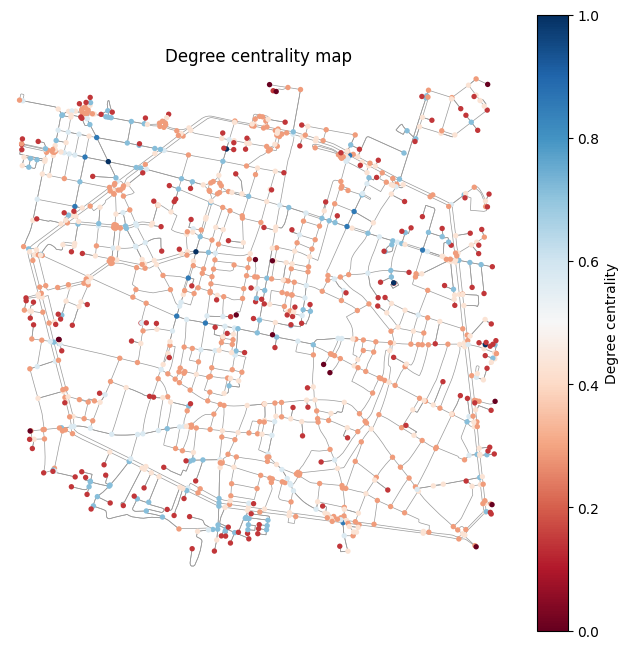

In [275]:
# compute degree centrality
degree_centrality = nx.degree_centrality(G)

dc_values = np.array([degree_centrality[node] for node in G.nodes])

# normalize 
norm_dc_values = (dc_values - min(dc_values)) / (max(dc_values) - min(dc_values))

# Plot the graph with a heatmap based on degree centrality
cmap = 'RdBu'
norm=plt.Normalize(vmin=norm_dc_values.min(), vmax=norm_dc_values.max())
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig, ax = ox.plot_graph(G, 
                        node_color=plt.cm.RdBu(norm_dc_values), 
                        node_size=15, 
                        edge_linewidth=0.5, 
                        bgcolor = 'white', 
                        show=False)

cb = fig.colorbar(sm, ax=ax, label = 'Degree centrality')
plt.axis('on')
plt.title('Degree centrality map')
plt.show()

Text(0, 0.5, '# of Nodes')

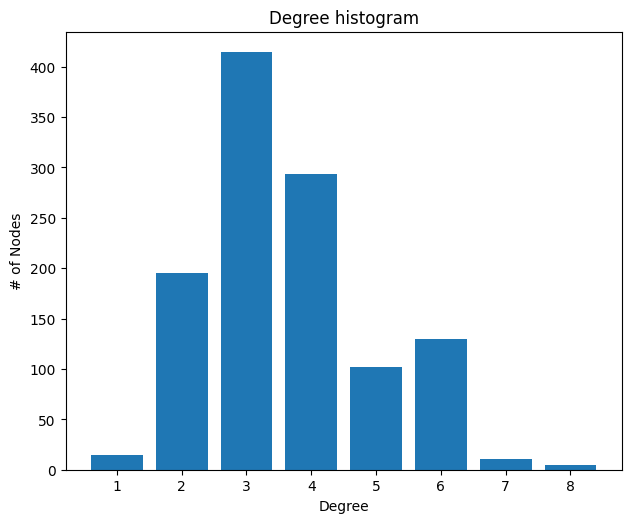

In [276]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)

fig = plt.figure("Degree of a random graph", figsize=(15, 15))

axgrid = fig.add_gridspec(5, 4)



ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

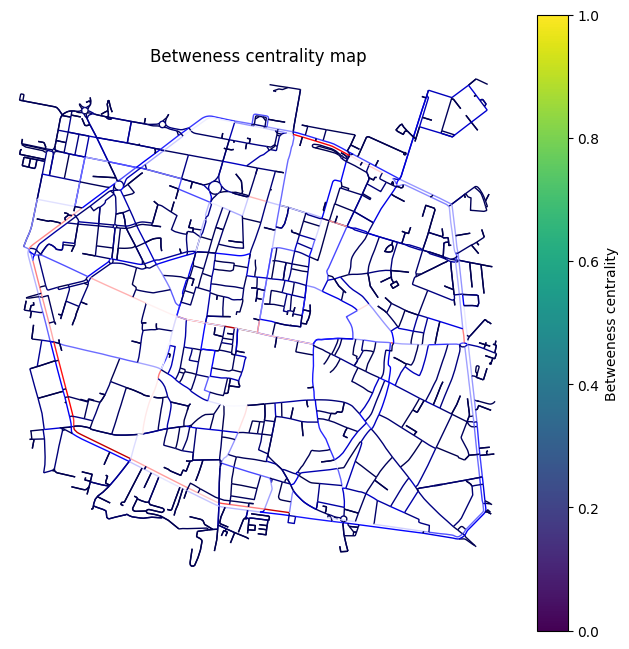

In [277]:
# compute betweness centrality
edge_betweenness_centrality = nx.edge_betweenness_centrality(G)

ebc_values = np.array([edge_betweenness_centrality[edge] for edge in G.edges])

#normalize
norm_ebc_values = (ebc_values - min(ebc_values)) / (max(ebc_values) - min(ebc_values))

# Plot
fig, ax = ox.plot_graph(
    G,
    bgcolor='white',
    node_size=0,
    edge_color=plt.cm.seismic(norm_ebc_values),  
    edge_linewidth=1, 
    show=False
)

# Color bar
cbar = plt.colorbar(ax.collections[0], ax=ax, label='Betweeness centrality')

plt.axis('on')
plt.title('Betweness centrality map')
plt.show()

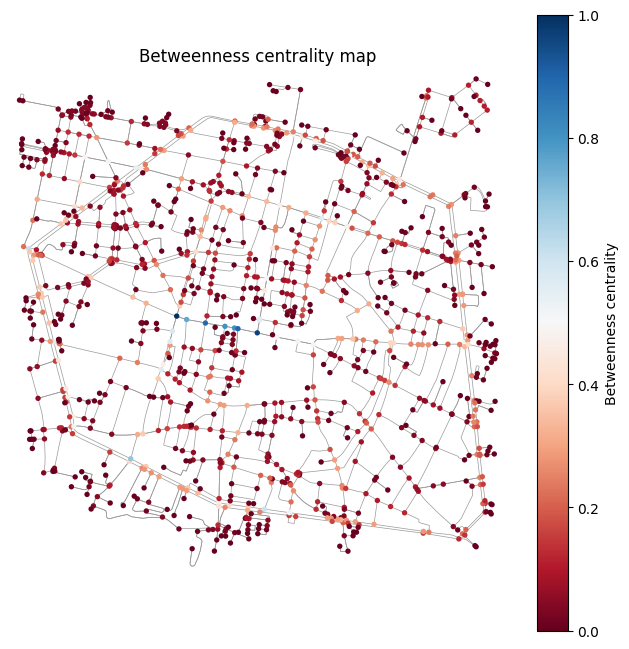

In [278]:
# compute betweness centrality
betweenness_centrality = nx.betweenness_centrality(G)

ebc_values = np.array([betweenness_centrality[node] for node in G.nodes])

#normalize
norm_ebc_values = (ebc_values - min(ebc_values)) / (max(ebc_values) - min(ebc_values))


cmap = 'RdBu'
norm=plt.Normalize(vmin=norm_ebc_values.min(), vmax=norm_ebc_values.max())
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig, ax = ox.plot_graph(G, node_color=plt.cm.RdBu(norm_ebc_values), node_size=15, edge_linewidth=0.5, bgcolor = 'white', show=False)

cb = fig.colorbar(sm, ax=ax, label = 'Betweenness centrality')
plt.axis('on')
plt.title('Betweenness centrality map')
plt.show()

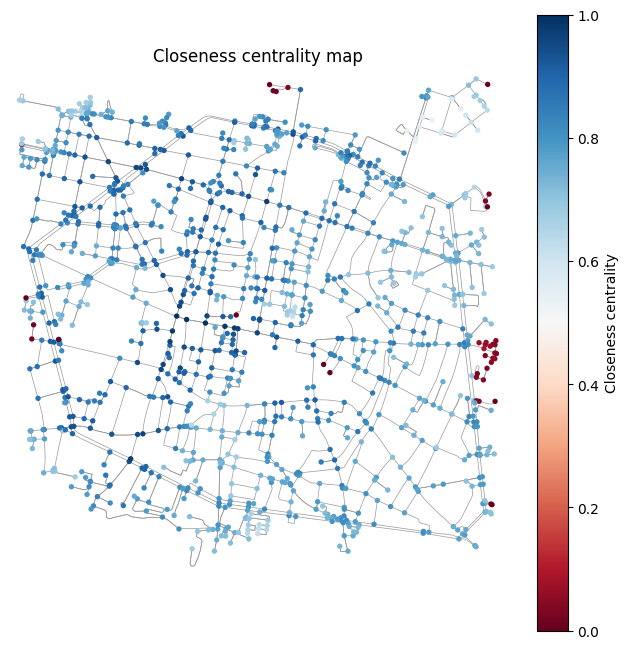

In [279]:
# compute closeness centrality
closeness_centrality = nx.closeness_centrality(G)

c_values = np.array([closeness_centrality[node] for node in G.nodes])

#normalize
norm_c_values = (c_values - min(c_values)) / (max(c_values) - min(c_values))


cmap = 'RdBu'
norm=plt.Normalize(vmin=norm_c_values.min(), vmax=norm_c_values.max())
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig, ax = ox.plot_graph(G, node_color=plt.cm.RdBu(norm_c_values), node_size=15, edge_linewidth=0.5, bgcolor = 'white', show=False)

cb = fig.colorbar(sm, ax=ax, label = 'Closeness centrality')
plt.axis('on')
plt.title('Closeness centrality map')
plt.show()

In [280]:
#computing Global Efficiency
G1 = global_efficiency(G)

#computing Information Centrality
G.remove_edge(4,7) #remove some edges wiht for loops
G2 = global_efficiency(G) #ma perchè scriviamo in inglese?
print(G1,G2, G1-G2, (G1-G2)/G1) #scemo chi legge
#G.edges #scemo chi l'edges

5.352983545594665e-05 5.3516737455961295e-05 1.3097999985352553e-08 0.0002446859750976031


In [281]:
plt.rcParams['animation.embed_limit'] = 2**128

# CLASSE CARS

In [282]:
class Car():
    def __init__(self):
        self.journey = np.zeros((2))
        self.position = np.zeros((2))
        self.velocity = np.zeros((2))
        self.accel = np.zeros((2))
        #self.n_cars = n_cars
        self.max_speed = 0
        self.position_along_path =0


    def get_position(self):
        return self.position
    
    def get_velocity(self):
        return self.velocity
    
    #def get_n_cars(self):
     #   return self.n_cars
    
    def get_velocity_angle(self):
        vx = self.velocity[0]
        v = np.linalg.norm(self.velocity)
        arccos = np.arccos(vx/v)
        if arccos > 0:
            if self.velocity[1] > 0:
                angle = arccos*180/np.pi
            elif self.velocity[1] < 0:
                angle = -arccos*180/np.pi
            else:
                angle = 0
        
        if arccos < 0:
            if self.velocity[1] > 0:
                angle = arccos*180/np.pi
            elif self.velocity[1] < 0:
                angle = -arccos*180/np.pi
            else:
                angle = 180

        if arccos == 0:
            if self.velocity[1] > 0:
                angle = 90
            elif self.velocity[1] < 0:
                angle = 270

        return angle
             
    
    def set_initial_condition(self,graph,max_speed,nodes,edges):
        self.max_speed = max_speed

        start = random.randint(min(graph.nodes) , max(graph.nodes))
        target = random.randint(min(graph.nodes) , max(graph.nodes))
        road = None

        while target==start or road is None:
            target = random.randint(min(graph.nodes) , max(graph.nodes))
            road = ox.shortest_path(graph,start,target,weight='travelling_time')

        for l in range(len(road)-1):
            edges.loc[(road[l],road[l+1]),'passage'][0] += 1
                
        #graph = ox.graph_from_gdfs(nodes,edges) #CONTROLLA E CORREGGI QUESTA PARTE MOLTO IMPORTANTE
            
        self.journey = (start , target)

        node_direction = np.array([nodes['x'][road[1]] - nodes['x'][road[0]] , nodes['y'][road[1]] - nodes['y'][road[0]]])
        node_direction /= np.linalg.norm(node_direction)

        self.position = (nodes['x'][start] , nodes['y'][start])

        v = random.uniform(max_speed/6 , max_speed)
        self.velocity = v*node_direction



    def update(self,graph,size,radius,turn_range,dt):

        nodes, _ = ox.graph_to_gdfs(graph, nodes=True, edges=True)
        nodes['x'] = ((nodes['x'] - min(nodes['x']))/(max(nodes['x'])-min(nodes['x'])))*size
        nodes['y'] = ((nodes['y']-min(nodes['y']))/(max(nodes['y']) - min(nodes['y'])))*size

        road = ox.shortest_path(graph,self.journey[0],self.journey[1],weight='travelling_time')
        L = len(road)
        
        #stop travelling when target reached
        if np.linalg.norm(self.position- np.array([nodes['x'][road[L-1]] , nodes['y'][road[L-1]]])) <= turn_range*2:
            self.velocity = (0.0001,0.0001)
            self.position = (-1,-1)
            
        v_abs = np.linalg.norm(self.velocity)
        
        #change direction if an intermediate node is near
        if np.linalg.norm(self.position-np.array([(nodes['x'][road[self.position_along_path+1]]) , nodes['y'][road[self.position_along_path+1]]])) <= turn_range*2:
            self.position_along_path += 1
        
        node_direction = np.array([nodes['x'][road[self.position_along_path+1]]- self.position[0] , nodes['y'][road[self.position_along_path+1]] - self.position[1]])
        node_direction /= np.linalg.norm(node_direction)

        self.velocity = v_abs*node_direction
            

        self.position += self.velocity*dt
            

# Funzione che usa la classe CARS

In [283]:
def simulation_cars(graph, n_cars, radius, max_speed, size = 100, scale = 0.6, turn_range = 0.1, dt = 0.2, n_time_steps = 300, map = True, animate = True):
    
    '''size : refers to maximum value of animation image boundaries. Needs to be converted in meters using Bologna diameter

       scale : refers to arrows dimensions within the animation
       
       turn range : range with which the car sees a new node and turn its velocity. Take it around  max_speed*dt
       '''

    cars=np.array([Car() for i in range(n_cars)])
    c_positions = np.zeros((n_time_steps, n_cars, 2))
    c_velocities = np.zeros((n_time_steps, n_cars, 2))

    nodes, edges = ox.graph_to_gdfs(graph, nodes=True, edges=True)
    nodes['x'] = ((nodes['x'] - min(nodes['x']))/(max(nodes['x'])-min(nodes['x'])))*size
    nodes['y'] = ((nodes['y']-min(nodes['y']))/(max(nodes['y']) - min(nodes['y'])))*size

    #traffic_graph = cars.set_initial_condition(graph,max_speed,nodes,edges)

    # Creo n_cars macchine e le aggiungo in un vettore che le contiene tutte
    for i in range(n_cars):
        cars[i].set_initial_condition(graph,max_speed,nodes,edges)
              
    #for loop computing time steps for animation
    for n in tqdm(range(n_time_steps)):
        for i in range(n_cars):
            c_positions[n][i] = cars[i].get_position()
            c_velocities[n][i] = cars[i].get_velocity()
            cars[i].update(graph,size,radius,turn_range,dt)
            
            #ACCELERAZIONI SE VEDE MACCHINE
            for n_car in range(n_cars):
                if n_car!=i and np.linalg.norm(c_positions[n][i] - c_positions[n][n_car]) <= 1: #5 è per vedere se funziona
                    diff_angles = np.abs(cars[n_car].get_velocity_angle() - cars[i].get_velocity_angle())
                    if diff_angles <= 160 and diff_angles >= 20:
                        cars[i].accel = -cars[i].velocity
                        cars[i].velocity += cars[i].accel*dt
                        cars[i].update(graph,size,radius,turn_range,dt)
            c_positions[n][i] = cars[i].get_position()
            c_velocities[n][i] = cars[i].get_velocity()
            
        #print("positions", c_positions )
        #print("velocità", c_velocities)


    traffic_graph = ox.graph_from_gdfs(nodes,edges)
    # Get edge lengths
    edge_lengths = [data['passage'] for u, v, key, data in traffic_graph.edges(keys=True, data=True)]
 
    # Define a colormap
    cmap = plt.cm.RdBu  # You can choose any other colormap

    # Normalize edge lengths
    norm = plt.Normalize(min(edge_lengths), max(edge_lengths))

    # Map edge lengths to colors
    colors = [cmap(norm(length)) for length in edge_lengths]

    #Plot the network with colored edges
    fig, ax = ox.plot_graph(traffic_graph, edge_color=colors, node_size=0, bgcolor='black', edge_linewidth=0.5,show=False)

    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax,label='Edge Length')
    plt.title('Roads more populated')
    plt.show()
    
    if animate:
        fig, ax = plt.subplots(figsize=(7,7))

        if map:
            for N in range(len(graph.nodes)):
                circle = plt.Circle((nodes['x'][N] , nodes['y'][N]) , size/900, color = 'grey')
                ax.add_patch(circle)
        
        
        velocities_magnitudes = np.linalg.norm(c_velocities[0], axis=1)
        velocities_normalized = c_velocities[0] / np.vstack([velocities_magnitudes, velocities_magnitudes]).T 
        #velocities_normalized = c_velocities[0] * 0.5
        scat = ax.quiver(c_positions[0][:,0], 
                         c_positions[0][:,1],
                         velocities_normalized[:,0],
                         velocities_normalized[:,1], color = 'red')
        
        
        ax.set_xlim(0,size)
        ax.set_ylim(0,size)

        #update function useful for animation
        def update(frame):
            scat.set_offsets(c_positions[frame])

            velocities_magnitudes = np.linalg.norm(c_velocities[frame], axis=1)
            velocities_normalized = c_velocities[frame]/ np.vstack([velocities_magnitudes, velocities_magnitudes]).T 
            #velocities_normalized *= scale
            scat.set_UVC(velocities_normalized[:,0]*scale, 
                         velocities_normalized[:,1]*scale)
            #print(velocities_normalized[:,0]*scale)
            return scat,

        ani = FuncAnimation(fig, update, frames=n_time_steps, blit=True)
        print(f"\nMaximum space traveled : {2*radius*n_time_steps*dt*max_speed/size}m (taking Bologna diameter {2*radius}m)")
        v_50 = (13.8*size)/(2*radius)
        print(f"Velocity respect to 50 Km/h is {max_speed/v_50} faster \n")
        print("Animation finished. Video processing ...")
        display(HTML(ani.to_jshtml()))

    nodes, edges = ox.graph_to_gdfs(traffic_graph, nodes=True, edges=True)
    
    return nodes , edges

  0%|          | 0/100 [00:00<?, ?it/s]

velocità [ 0.93542021 -0.18886693]
position_along_path 0
velocità [-0.10813416 -0.61049783]
position_along_path 0
velocità [-0.97989248  0.07921185]
position_along_path 0
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.19391846  0.52220505]
position_along_path 0
velocità [-0.18422253  0.49609479]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92329243 -0.13548394]
position_along_path 0
velocità [-0.03284083  0.43687365]
position_along_path 0
velocità [-0.03119879  0.41502996]
position_along_path 0
velocità [0.23032054 0.01875662]
position_along_path 0
velocità [ 0.68110548 -0.41551709]
position_along_path 0
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.9630934  -0.08915316]
position_along_path 0
velocità [0.02726071 0.32455446]
position_along_path 0
velocità [0.02589767 0.30832674]
position_along_path 0
velocità [-0.24380977  0.03855806]
posi

  1%|          | 1/100 [00:03<05:36,  3.40s/it]

velocità [-0.03774757  0.4251337 ]
position_along_path 0
velocità [ 0.93542021 -0.18886693]
position_along_path 0
velocità [-0.10813416 -0.61049783]
position_along_path 0
velocità [-0.91968243 -0.34734423]
position_along_path 1
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.18422253  0.49609479]
position_along_path 0
velocità [-0.17501141  0.47129005]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92329243 -0.13548394]
position_along_path 0
velocità [-0.03119879  0.41502996]
position_along_path 0
velocità [-0.02963885  0.39427847]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [ 0.68110548 -0.41551709]
position_along_path 0
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.9630934  -0.08915316]
position_along_path 0
velocità [ 0.34750604 -0.85060317]
position_along_path 1
velocità [0.02589767 0.30832674]
po

  2%|▏         | 2/100 [00:07<05:55,  3.63s/it]

velocità [-0.03774757  0.4251337 ]
position_along_path 0
velocità [ 0.93542021 -0.18886693]
position_along_path 0
velocità [-0.10813416 -0.61049783]
position_along_path 0
velocità [-0.7730564  -0.60732824]
position_along_path 2
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.17501141  0.47129005]
position_along_path 0
velocità [-0.16626084  0.44772555]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92329243 -0.13548394]
position_along_path 0
velocità [-0.02963885  0.39427847]
position_along_path 0
velocità [-0.02815691  0.37456454]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [ 0.68110548 -0.41551709]
position_along_path 0
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.34750604 -0.85060317]
position_along_path 1
velocità [ 0.33013074 -0.80807301]
position_along_path 1
velocità [0.02460279 0.2929104 ]
po

  3%|▎         | 3/100 [00:10<05:48,  3.59s/it]

velocità [-0.03774757  0.4251337 ]
position_along_path 0
velocità [ 0.93541804 -0.18887766]
position_along_path 1
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.10687509 -0.97726225]
position_along_path 3
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.16626084  0.44772555]
position_along_path 0
velocità [-0.15794779  0.42533927]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [-0.02815691  0.37456454]
position_along_path 0
velocità [-0.02674906  0.35583631]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [ 0.68110548 -0.41551709]
position_along_path 0
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.33013074 -0.80807301]
position_along_path 1
velocità [ 0.3136242  -0.76766936]
position_along_path 1
velocità [0.02337265 0.27826488]
posi

  4%|▍         | 4/100 [00:14<06:05,  3.81s/it]

velocità [0.05683208 0.42300551]
position_along_path 1
velocità [ 0.93541804 -0.18887766]
position_along_path 1
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.71863048 -0.67084575]
position_along_path 4
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.15794779  0.42533927]
position_along_path 0
velocità [-0.1500504   0.40407231]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [-0.02674906  0.35583631]
position_along_path 0
velocità [-0.02541161  0.3380445 ]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.3136242  -0.76766936]
position_along_path 1
velocità [ 0.29794299 -0.72928589]
position_along_path 1
velocità [-0.22725056  0.10895158]
positi

  5%|▌         | 5/100 [00:19<06:25,  4.06s/it]

velocità [0.05683208 0.42300551]
position_along_path 1
velocità [ 0.93541804 -0.18887766]
position_along_path 1
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [0.96894008 0.16618937]
position_along_path 5
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.1500504   0.40407231]
position_along_path 0
velocità [-0.14254788  0.38386869]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [-0.02541161  0.3380445 ]
position_along_path 0
velocità [-0.02414103  0.32114227]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.29794299 -0.72928589]
position_along_path 1
velocità [ 0.28304584 -0.6928216 ]
position_along_path 1
velocità [-0.20509363  0.0983288 ]
position

  6%|▌         | 6/100 [00:23<06:17,  4.02s/it]

velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [ 0.93543691 -0.18878419]
position_along_path 2
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [0.85208072 0.49032869]
position_along_path 6
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.14254788  0.38386869]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [-0.02414103  0.32114227]
position_along_path 0
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.04149177 -0.74725842]
position_along_path 2
velocità [-0.185097    0.08874174]
position_along_path 1
velocità [-0.17584215  0.08430465]
position_along_path 1
velocità [-0.16705004  0.08008942]
position_along_path 1
velocità [-0.244087    0.03676223]
positi

  7%|▋         | 7/100 [00:26<06:02,  3.90s/it]

velocità [-0.23763092 -0.57730053]
position_along_path 0
velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [ 0.93543691 -0.18878419]
position_along_path 2
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.91907538 -0.34894732]
position_along_path 7
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.14254788  0.38386869]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [-0.02414103  0.32114227]
position_along_path 0
velocità [0.09008407 0.29238294]
position_along_path 1
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.04149177 -0.74725842]
position_along_path 2
velocità [-0.16705004  0.08008942]
position_along_path 1
velocità [-0.15869754  0.07608495]
positi

  8%|▊         | 8/100 [00:30<05:49,  3.80s/it]

velocità [-0.23763092 -0.57730053]
position_along_path 0
velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [ 0.93543691 -0.18878419]
position_along_path 2
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.9533894  -0.23981751]
position_along_path 8
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.14254788  0.38386869]
position_along_path 0
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.09008407 0.29238294]
position_along_path 1
velocità [0.0567034  0.28506379]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.66773769  0.12795153]
position_along_path 0
velocità [ 0.03912405 -0.74738613]
position_along_path 3
velocità [-0.15076266  0.0722807 ]
position_along_path 1
velocità [-0.14322453  0.06866667]
position

  9%|▉         | 9/100 [00:37<07:06,  4.69s/it]

velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [0.89290428 0.33675455]
position_along_path 3
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.95645139 -0.22729832]
position_along_path 9
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.19194783  0.36170583]
position_along_path 1
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.0567034  0.28506379]
position_along_path 2
velocità [0.05386823 0.2708106 ]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.09033923  0.67385758]
position_along_path 1
velocità [ 0.03912405 -0.74738613]
position_along_path 3
velocità [-0.1360633   0.06523333]
position_along_path 1
velocità [-0.244087    0.03676223]
position_along_path 1
velocità [-0.02120538  0.37187648]
position_a

 10%|█         | 10/100 [00:42<07:06,  4.74s/it]

velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [0.29455467 0.90769996]
position_along_path 4
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.95645139 -0.22729832]
position_along_path 9
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.29212984  0.28694116]
position_along_path 2
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.05386823 0.2708106 ]
position_along_path 2
velocità [0.05117482 0.25727007]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.09033923  0.67385758]
position_along_path 1
velocità [ 0.61485586 -0.42669542]
position_along_path 4
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.244087    0.03676223]
position_along_path 1
velocità [-0.02014511  0.35328266]
position_a

 11%|█         | 11/100 [00:45<06:25,  4.33s/it]

velocità [-0.23763092 -0.57730053]
position_along_path 0
velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [0.29455467 0.90769996]
position_along_path 4
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.95645139 -0.22729832]
position_along_path 9
velocità [-0.24067095  0.0833525 ]
position_along_path 0
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.29212984  0.28694116]
position_along_path 2
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.05117482 0.25727007]
position_along_path 2
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.35513463 0.7144498 ]
position_along_path 1
velocità [-0.09033923  0.67385758]
position_along_path 1
velocità [ 0.61485586 -0.42669542]
position_along_path 4
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_a

 12%|█▏        | 12/100 [00:48<05:57,  4.06s/it]

velocità [-0.23763092 -0.57730053]
position_along_path 0
velocità [-0.31161153  0.29165356]
position_along_path 2
velocità [0.41383432 0.85989699]
position_along_path 5
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.95645139 -0.22729832]
position_along_path 9
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.29212984  0.28694116]
position_along_path 2
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.30548242 0.73704791]
position_along_path 2
velocità [-0.09033923  0.67385758]
position_along_path 1
velocità [ 0.61485586 -0.42669542]
position_along_path 4
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_a

 13%|█▎        | 13/100 [00:52<05:47,  4.00s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [0.90830939 0.29267   ]
position_along_path 6
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.95645139 -0.22729832]
position_along_path 9
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [-0.09033923  0.67385758]
position_along_path 1
velocità [ 0.61485586 -0.42669542]
position_along_path 4
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_along_path 1
velocità [-0.07578613  0.0167935 ]
position_a

 14%|█▍        | 14/100 [00:55<05:22,  3.75s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [0.90830939 0.29267   ]
position_along_path 6
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96256628 -0.19982477]
position_along_path 10
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.61485586 -0.42669542]
position_along_path 4
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_along_path 1
velocità [-0.07199683  0.01595383]
position_al

 15%|█▌        | 15/100 [00:59<05:05,  3.60s/it]

velocità [-0.23763092 -0.57730053]
position_along_path 0
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [0.94422471 0.13828003]
position_along_path 7
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96493272 -0.18806552]
position_along_path 11
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.55978382 -0.49674822]
position_along_path 5
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_al

 16%|█▌        | 16/100 [01:02<04:52,  3.48s/it]

velocità [ 0.39588257 -0.44161213]
position_along_path 1
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.918887   -0.25754291]
position_along_path 8
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [0.03212583 0.22883901]
position_along_path 1
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.55978382 -0.49674822]
position_along_path 5
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_

 17%|█▋        | 17/100 [01:05<04:41,  3.39s/it]

velocità [ 0.37608844 -0.41953153]
position_along_path 1
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [0.21214459 0.9304173 ]
position_along_path 9
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.04861608 0.24440656]
position_along_path 2
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.55978382 -0.49674822]
position_along_path 5
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24431518  0.03521387]
position_along_path 2
velocità [0.32960063 0.06610203]
position_

 18%|█▊        | 18/100 [01:08<04:32,  3.32s/it]

velocità [0.1737015  0.50628619]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.91130549 -0.28320309]
position_along_path 10
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.9246906 -0.125587 ]
position_along_path 1
velocità [0.0478451  0.24455866]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.55978382 -0.49674822]
position_along_path 5
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [0.32960063 0.06610203]
position

 19%|█▉        | 19/100 [01:12<04:28,  3.32s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.92239239 -0.24469156]
position_along_path 11
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.05997337  0.40506576]
position_along_path 3
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92629548 -0.11314367]
position_along_path 2
velocità [0.0478451  0.24455866]
position_along_path 3
velocità [0.04545285 0.23233072]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [0.32960063 0.06610203]
positi

 20%|██        | 20/100 [01:15<04:28,  3.35s/it]

velocità [0.1567656  0.45692329]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.92239239 -0.24469156]
position_along_path 11
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92629548 -0.11314367]
position_along_path 2
velocità [0.04545285 0.23233072]
position_along_path 3
velocità [0.04318021 0.22071419]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [0.2440583  0.75960165]
position_along_path 3
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24451603  0.03379111]
positi

 21%|██        | 21/100 [01:18<04:14,  3.23s/it]

velocità [0.14892732 0.43407712]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.9252726 -0.2335643]
position_along_path 12
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92629548 -0.11314367]
position_along_path 2
velocità [0.04318021 0.22071419]
position_along_path 3
velocità [0.0410212  0.20967848]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24451603  0.03379111]
positi

 22%|██▏       | 22/100 [01:21<04:04,  3.13s/it]

velocità [0.14148096 0.41237327]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.9252726 -0.2335643]
position_along_path 12
velocità [-0.61056392  0.10776033]
position_along_path 1
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26415877 0.0232785 ]
position_along_path 0
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92629548 -0.11314367]
position_along_path 2
velocità [0.0410212  0.20967848]
position_along_path 3
velocità [0.03897014 0.19919456]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.09875485 -0.11408809]
position_along_path 2
velocità [-0.24451603  0.03379111]
positi

 23%|██▎       | 23/100 [01:24<03:59,  3.12s/it]

velocità [0.13440691 0.3917546 ]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93200497 -0.20505709]
position_along_path 13
velocità [-0.50638867  0.3577305 ]
position_along_path 2
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26429627 0.0216617 ]
position_along_path 1
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83384932  0.12145198]
position_along_path 0
velocità [ 0.92629548 -0.11314367]
position_along_path 2
velocità [0.31943702 0.82697   ]
position_along_path 3
velocità [0.03897014 0.19919456]
position_along_path 3
velocità [0.03702163 0.18923483]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.13637643 -0.06457616]
positi

 24%|██▍       | 24/100 [01:27<04:00,  3.17s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93200497 -0.20505709]
position_along_path 13
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.96598589 -0.1825789 ]
position_along_path 12
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.84655962  0.26316571]
position_along_path 4
velocità [0.03702163 0.18923483]
position_along_path 3
velocità [0.03517055 0.17977309]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.41906497 -0.62008166]
position_along_path 6
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [0.32960063 0.06610203]
posi

 25%|██▌       | 25/100 [01:31<04:09,  3.32s/it]

velocità [0.12130223 0.35355853]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93200497 -0.20505709]
position_along_path 13
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.96736724 -0.17511257]
position_along_path 13
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87372234  0.15009548]
position_along_path 5
velocità [0.03517055 0.17977309]
position_along_path 3
velocità [0.03341202 0.17078443]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05214937 0.67788321]
position_along_path 2
velocità [ 0.37748194 -0.64623843]
position_along_path 7
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]
posi

 26%|██▌       | 26/100 [01:35<04:14,  3.44s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93536842 -0.18912323]
position_along_path 14
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.96736724 -0.17511257]
position_along_path 13
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87372234  0.15009548]
position_along_path 5
velocità [0.03341202 0.17078443]
position_along_path 3
velocità [0.03174142 0.16224521]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05442977 0.67770392]
position_along_path 3
velocità [ 0.37748194 -0.64623843]
position_along_path 7
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [ 0.16803324 -0.29115439]
po

 27%|██▋       | 27/100 [01:38<04:04,  3.35s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93536842 -0.18912323]
position_along_path 14
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.96736724 -0.17511257]
position_along_path 13
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87631126  0.13415652]
position_along_path 6
velocità [0.03174142 0.16224521]
position_along_path 3
velocità [0.03015435 0.15413295]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [0.05442977 0.67770392]
position_along_path 3
velocità [ 0.37748194 -0.64623843]
position_along_path 7
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [ 0.16803324 -0.29115439]
po

 28%|██▊       | 28/100 [01:41<03:59,  3.32s/it]

velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93536842 -0.18912323]
position_along_path 14
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.96736724 -0.17511257]
position_along_path 13
velocità [ 0.91899887 -0.16635695]
position_along_path 13
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87631126  0.13415652]
position_along_path 6
velocità [0.03015435 0.15413295]
position_along_path 3
velocità [0.02864663 0.1464263 ]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [ 0.35790962 -0.65728032]
position_along_path 8
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]

 29%|██▉       | 29/100 [01:45<04:09,  3.52s/it]

velocità [0.09880143 0.28797563]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93536842 -0.18912323]
position_along_path 14
velocità [-0.58684842 -0.20002381]
position_along_path 3
velocità [ 0.91702465 -0.17691622]
position_along_path 14
velocità [ 0.87117342 -0.1680704 ]
position_along_path 14
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.3690213   0.17747776]
position_along_path 4
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02864663 0.1464263 ]
position_along_path 3
velocità [0.0272143  0.13910499]
position_along_path 3
velocità [-0.00567821  0.23101325]
position_along_path 2
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [ 0.33074384 -0.67136073]
position_along_path 9
velocità [-0.13637643 -0.06457616]
p

 30%|███       | 30/100 [01:48<04:01,  3.45s/it]

velocità [0.09386136 0.27357685]
position_along_path 2
velocità [-0.03206696  0.42559988]
position_along_path 3
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.5451516  -0.29531394]
position_along_path 4
velocità [ 0.8756148 -0.1431416]
position_along_path 15
velocità [ 0.83183406 -0.13598452]
position_along_path 15
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.09800365  0.39758063]
position_along_path 5
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.0272143  0.13910499]
position_along_path 3
velocità [0.02585359 0.13214974]
position_along_path 3
velocità [-0.01437181  0.23063567]
position_along_path 3
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [ 0.33074384 -0.67136073]
position_along_path 9
velocità [-0.13637643 -0.06457616]
pos

 31%|███       | 31/100 [01:52<03:54,  3.39s/it]

velocità [0.08916829 0.25989801]
position_along_path 2
velocità [-0.00753858  0.42673963]
position_along_path 4
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.5451516  -0.29531394]
position_along_path 4
velocità [ 0.83183406 -0.13598452]
position_along_path 15
velocità [ 0.79024236 -0.12918529]
position_along_path 15
velocità [-0.12568608 -0.22152461]
position_along_path 1
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.09800365  0.39758063]
position_along_path 5
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02585359 0.13214974]
position_along_path 3
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.01437181  0.23063567]
position_along_path 3
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [ 0.33074384 -0.67136073]
position_along_path 9
velocità [-0.13637643 -0.06457616]
p

 32%|███▏      | 32/100 [01:55<03:50,  3.39s/it]

velocità [-0.00753858  0.42673963]
position_along_path 4
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.79024236 -0.12918529]
position_along_path 15
velocità [ 0.75073024 -0.12272603]
position_along_path 15
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.09800365  0.39758063]
position_along_path 5
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.01437181  0.23063567]
position_along_path 3
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.13637643 -0.06457616]
position_along_path 3
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [ 0.16803324 -0.291154

 33%|███▎      | 33/100 [01:58<03:41,  3.31s/it]

velocità [0.08047438 0.23455795]
position_along_path 2
velocità [-0.00753858  0.42673963]
position_along_path 4
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.74423059 -0.15741156]
position_along_path 16
velocità [ 0.70701906 -0.14954099]
position_along_path 16
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [-0.04336581  0.40717868]
position_along_path 6
velocità [-0.83455664  0.1164924 ]
position_along_path 1
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.01437181  0.23063567]
position_along_path 3
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.15078374 -0.00573365]
position_along_path 4
velocità [-0.24451603  0.03379111

 34%|███▍      | 34/100 [02:01<03:34,  3.25s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.69928678 -0.18230869]
position_along_path 17
velocità [ 0.66432244 -0.17319325]
position_along_path 17
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83431598  0.1182037 ]
position_along_path 2
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.01437181  0.23063567]
position_along_path 3
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.15078374 -0.00573365]
position_along_path 4
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [ 0.16803324 -0.29115439

 35%|███▌      | 35/100 [02:05<03:37,  3.34s/it]

velocità [0.07262813 0.21168855]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.66432244 -0.17319325]
position_along_path 17
velocità [ 0.63110632 -0.16453359]
position_along_path 17
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83431598  0.1182037 ]
position_along_path 2
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.15078374 -0.00573365]
position_along_path 4
velocità [-0.14324455 -0.00544696]


 36%|███▌      | 36/100 [02:08<03:33,  3.34s/it]

velocità [0.06899672 0.20110412]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.63110632 -0.16453359]
position_along_path 17
velocità [ 0.599551   -0.15630691]
position_along_path 17
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83431598  0.1182037 ]
position_along_path 2
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.14324455 -0.00544696]
position_along_path 4
velocità [-0.13608232 -0.00517462]


 37%|███▋      | 37/100 [02:11<03:28,  3.30s/it]

velocità [0.06554689 0.19104892]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.599551   -0.15630691]
position_along_path 17
velocità [ 0.56957345 -0.14849156]
position_along_path 17
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83431598  0.1182037 ]
position_along_path 2
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.70402487  0.3753773 ]
position_along_path 4
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.13608232 -0.00517462]
position_along_path 4
velocità [-0.12927821 -0.00491589]


 38%|███▊      | 38/100 [02:15<03:32,  3.43s/it]

velocità [0.06226954 0.18149647]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.53068796 -0.25462512]
position_along_path 18
velocità [ 0.50415356 -0.24189386]
position_along_path 18
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83560231  0.10873845]
position_along_path 3
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [0.02607433 0.79742038]
position_along_path 5
velocità [-0.66324376  0.14950894]
position_along_path 4
velocità [-0.03997771 -0.74734095]
position_along_path 10
velocità [-0.12927821 -0.00491589]
position_along_path 4
velocità [-0.1228143  -0.00467009]
po

 39%|███▉      | 39/100 [02:19<03:44,  3.69s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.50415356 -0.24189386]
position_along_path 18
velocità [ 0.47894588 -0.22979917]
position_along_path 18
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [0.26419321 0.02288441]
position_along_path 2
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83560231  0.10873845]
position_along_path 3
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [0.02607433 0.79742038]
position_along_path 5
velocità [-0.57558969 -0.36185869]
position_along_path 5
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.1228143  -0.00467009]
position_along_path 4
velocità [-0.11667358 -0.00443659]
position_along_path 4
velocità [-0.24451603  0.03379111]


 40%|████      | 40/100 [02:24<03:55,  3.92s/it]

velocità [0.05619826 0.16380057]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93593498 -0.18629919]
position_along_path 15
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [ 0.41558179 -0.3308906 ]
position_along_path 19
velocità [ 0.3948027  -0.31434607]
position_along_path 19
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83560231  0.10873845]
position_along_path 3
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [0.02607433 0.79742038]
position_along_path 5
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.11667358 -0.00443659]
position_along_path 4
velocità [-0.1108399  -0.00421476]


 41%|████      | 41/100 [02:29<04:08,  4.22s/it]

velocità [0.05338835 0.15561054]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83397462  0.12058856]
position_along_path 4
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [0.02607433 0.79742038]
position_along_path 5
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.1108399  -0.00421476]
position_along_path 4
velocità [-0.10529791 -0.00400402]
position_along_path 4
velocità [-0.24451603  0.03379111]
pos

 42%|████▏     | 42/100 [02:33<04:04,  4.22s/it]

velocità [0.05071893 0.14783001]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83397462  0.12058856]
position_along_path 4
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [0.02607433 0.79742038]
position_along_path 5
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.10529791 -0.00400402]
position_along_path 4
velocità [-0.10003301 -0.00380382]
position_along_path 4
velocità [-0.24451603  0.03379111]
pos

 43%|████▎     | 43/100 [02:37<03:58,  4.18s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83380494  0.12175627]
position_along_path 5
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.10003301 -0.00380382]
position_along_path 4
velocità [-0.09503136 -0.00361363]
position_along_path 4
velocità [-0.24451603  0.03379111]
position_along_path 3
velocità [ 0.16803324 -0.29115439]

 44%|████▍     | 44/100 [02:40<03:35,  3.84s/it]

velocità [0.04577383 0.13341658]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [0.04976393 0.40644634]
position_along_path 7
velocità [-0.83380494  0.12175627]
position_along_path 5
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02456091 0.12554225]
position_along_path 3
velocità [0.02333286 0.11926514]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.0981572  -0.74194466]
position_along_path 11
velocità [-0.09503136 -0.00361363]
position_along_path 4
velocità [-0.09027979 -0.00343295]
pos

 45%|████▌     | 45/100 [02:44<03:32,  3.86s/it]

velocità [0.04348514 0.12674576]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.49591531 -0.37211368]
position_along_path 5
velocità [-0.47111955 -0.353508  ]
position_along_path 5
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83380494  0.12175627]
position_along_path 5
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02333286 0.11926514]
position_along_path 3
velocità [0.02216622 0.11330188]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.09027979 -0.00343295]
p

 46%|████▌     | 46/100 [02:49<03:46,  4.20s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.46951503 -0.35563629]
position_along_path 6
velocità [-0.44603928 -0.33785448]
position_along_path 6
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83436143  0.11788245]
position_along_path 6
velocità [-0.87810844  0.12183985]
position_along_path 7
velocità [0.02216622 0.11330188]
position_along_path 3
velocità [0.02105791 0.10763679]
position_along_path 3
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.0857658 -0.0032613]
position_along_path 4
velocità [-0.08147751 -0.00309823]
p

 47%|████▋     | 47/100 [02:53<03:45,  4.25s/it]

velocità [0.03924534 0.11438804]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.44603928 -0.33785448]
position_along_path 6
velocità [-0.42373731 -0.32096175]
position_along_path 6
velocità [0.47943713 0.1575521 ]
position_along_path 20
velocità [0.47072361 0.09094151]
position_along_path 21
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83436143  0.11788245]
position_along_path 6
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.08409515 0.07040681]
position_along_path 4
velocità [0.07989039 0.06688647]
position_along_path 4
velocità [0.07589587 0.06354215]
position_along_path 4
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
posit

 48%|████▊     | 48/100 [02:58<03:48,  4.38s/it]

velocità [0.03728307 0.10866864]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.42373731 -0.32096175]
position_along_path 6
velocità [-0.40316258 -0.30410383]
position_along_path 7
velocità [0.47072361 0.09094151]
position_along_path 21
velocità [0.44718743 0.08639444]
position_along_path 21
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07589587 0.06354215]
position_along_path 4
velocità [0.07210108 0.06036504]
position_along_path 4
velocità [0.06849602 0.05734679]
position_along_path 4
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
posit

 49%|████▉     | 49/100 [03:02<03:45,  4.42s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.40316258 -0.30410383]
position_along_path 7
velocità [-0.38300445 -0.28889864]
position_along_path 7
velocità [0.44718743 0.08639444]
position_along_path 21
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07504844 -0.24338833]
position_along_path 2
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.06849602 0.05734679]
position_along_path 4
velocità [0.06507122 0.05447945]
position_along_path 4
velocità [0.06181766 0.05175548]
position_along_path 4
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.74746554  0.03757644]
pos

 50%|█████     | 50/100 [03:07<03:40,  4.42s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.38300445 -0.28889864]
position_along_path 7
velocità [-0.36385423 -0.27445371]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.06181766 0.05175548]
position_along_path 4
velocità [0.05872678 0.0491677 ]
position_along_path 4
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.16147237 -0.6604331 ]
position_along_path 6
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.06985678 -0.00265635]
position_along_path 4
velocità [-0.06636394 -0.00252353]

 51%|█████     | 51/100 [03:10<03:21,  4.11s/it]

velocità [0.03196558 0.09316978]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.36385423 -0.27445371]
position_along_path 7
velocità [-0.34566152 -0.26073102]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.06636394 -0.00252353]
position_along_path 4
velocità [-0.06304575 -0.00239735]

 52%|█████▏    | 52/100 [03:13<03:02,  3.80s/it]

velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.93385874 -0.19644219]
position_along_path 16
velocità [-0.34566152 -0.26073102]
position_along_path 7
velocità [-0.32837844 -0.24769447]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.06304575 -0.00239735]
position_along_path 4
velocità [-0.05989346 -0.00227749]
position_along_path 4
velocità [-0.24451603  0.0337911

 53%|█████▎    | 53/100 [03:16<02:48,  3.58s/it]

velocità [0.02884893 0.08408572]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.9445272  -0.13619854]
position_along_path 17
velocità [-0.32837844 -0.24769447]
position_along_path 7
velocità [-0.31195952 -0.23530975]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.05989346 -0.00227749]
position_along_path 4
velocità [-0.05689879 -0.00216361]

 54%|█████▍    | 54/100 [03:20<02:45,  3.60s/it]

velocità [0.02740649 0.07988144]
position_along_path 2
velocità [-0.35985906  0.22948857]
position_along_path 5
velocità [ 0.9445272  -0.13619854]
position_along_path 17
velocità [-0.31195952 -0.23530975]
position_along_path 7
velocità [-0.29636154 -0.22354426]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.05689879 -0.00216361]
position_along_path 4
velocità [-0.05405385 -0.00205543]

 55%|█████▌    | 55/100 [03:23<02:35,  3.46s/it]

velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.93307273 -0.20014233]
position_along_path 18
velocità [-0.29636154 -0.22354426]
position_along_path 7
velocità [-0.28154347 -0.21236705]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.08173951 -0.25227049]
position_along_path 3
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.05405385 -0.00205543]
position_along_path 4
velocità [-0.05135116 -0.00195266]
position_along_path 4
velocità [-0.24451603  0.0337911

 56%|█████▌    | 56/100 [03:26<02:27,  3.35s/it]

velocità [0.02473435 0.072093  ]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.93307273 -0.20014233]
position_along_path 18
velocità [-0.28154347 -0.21236705]
position_along_path 7
velocità [-0.26746629 -0.2017487 ]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [-0.63894846 -0.23235764]
position_along_path 7
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.05135116 -0.00195266]
position_along_path 4
velocità [-0.0487836  -0.00185503]

 57%|█████▋    | 57/100 [03:30<02:23,  3.33s/it]

velocità [0.02349764 0.06848835]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.93307273 -0.20014233]
position_along_path 18
velocità [-0.26746629 -0.2017487 ]
position_along_path 7
velocità [-0.25409298 -0.19166126]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [ 0.64792694 -0.20599974]
position_along_path 8
velocità [-0.74746554  0.03757644]
position_along_path 12
velocità [-0.0487836  -0.00185503]
position_along_path 4
velocità [-0.04634442 -0.00176228]

 58%|█████▊    | 58/100 [03:33<02:23,  3.42s/it]

velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.25409298 -0.19166126]
position_along_path 7
velocità [-0.24138833 -0.1820782 ]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.87755947  0.12573293]
position_along_path 8
velocità [0.11997066 0.8336062 ]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [ 0.64792694 -0.20599974]
position_along_path 8
velocità [-0.74258817  0.09316399]
position_along_path 13
velocità [-0.70545876  0.08850579]
position_along_path 13
velocità [-0.04634442 -0.00176228

 59%|█████▉    | 59/100 [03:37<02:21,  3.44s/it]

velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.24138833 -0.1820782 ]
position_along_path 7
velocità [-0.22931891 -0.17297429]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.11997066 0.8336062 ]
position_along_path 9
velocità [0.11397212 0.79192589]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità (0.0001, 0.0001)
position_along_path 8
velocità [-0.70545876  0.08850579]
position_along_path 13
velocità [-0.67018582  0.0840805 ]
position_along_path 13
velocità [-0.0440272  -0.00167416]
position_

 60%|██████    | 60/100 [03:40<02:20,  3.50s/it]

velocità [0.02014629 0.0587202 ]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.22931891 -0.17297429]
position_along_path 7
velocità [-0.21785297 -0.16432557]
position_along_path 7
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.11397212 0.79192589]
position_along_path 9
velocità [0.10827352 0.75232959]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.75603459  0.25489376]
position_along_path 6
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.67018582  0.0840805 ]
position_along_path 13
velocità [-0.63667653  0.0798764

 61%|██████    | 61/100 [03:44<02:18,  3.54s/it]

velocità [0.01913897 0.05578419]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.21944989 -0.16218679]
position_along_path 8
velocità [-0.20847739 -0.15407745]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.38733279  0.13284721]
position_along_path 8
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.10827352 0.75232959]
position_along_path 9
velocità [0.10285984 0.71471311]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.76918724  0.21192006]
position_along_path 7
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.63667653  0.07987648]
position_along_path 13
velocità [-0.6048427   0.0758826

 62%|██████▏   | 62/100 [03:47<02:14,  3.53s/it]

velocità [0.01818202 0.05299498]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.20847739 -0.15407745]
position_along_path 8
velocità [-0.19805353 -0.14637358]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.22815097 -0.13516243]
position_along_path 4
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.10285984 0.71471311]
position_along_path 9
velocità [0.09771685 0.67897746]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.76918724  0.21192006]
position_along_path 7
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.6048427   0.07588265]
position_along_path 13
velocità [-0.57410455  0.0759377

 63%|██████▎   | 63/100 [03:51<02:10,  3.52s/it]

velocità [0.01727292 0.05034523]
position_along_path 2
velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.19805353 -0.14637358]
position_along_path 8
velocità [-0.18815085 -0.1390549 ]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.09771685 0.67897746]
position_along_path 9
velocità [0.09283101 0.64502858]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.76918724  0.21192006]
position_along_path 7
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.57410455  0.07593772]
position_along_path 14
velocità [-0.54539932  0.0721408

 64%|██████▍   | 64/100 [03:55<02:13,  3.70s/it]

velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.18815085 -0.1390549 ]
position_along_path 8
velocità [-0.17874331 -0.13210215]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.09283101 0.64502858]
position_along_path 9
velocità [0.08818946 0.61277715]
position_along_path 9
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78662684  0.13333167]
position_along_path 8
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.54539932  0.07214083]
position_along_path 14
velocità [-0.51812935  0.06853379]
position_along_path 14
velocità [-0.03406741 -0.0012

 65%|██████▌   | 65/100 [03:59<02:07,  3.64s/it]

velocità [-0.37723991  0.19963366]
position_along_path 6
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.17874331 -0.13210215]
position_along_path 8
velocità [-0.16980614 -0.12549705]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [0.08818946 0.61277715]
position_along_path 9
velocità [-0.08777631  0.58154914]
position_along_path 10
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78662684  0.13333167]
position_along_path 8
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.51812935  0.06853379]
position_along_path 14
velocità [-0.49222289  0.0651071 ]
position_along_path 14
velocità [-0.03236404 -0.0

 66%|██████▌   | 66/100 [04:02<02:01,  3.58s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.16980614 -0.12549705]
position_along_path 8
velocità [-0.16131583 -0.11922219]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83475121  0.11508989]
position_along_path 7
velocità [-0.08777631  0.58154914]
position_along_path 10
velocità [-0.0833875   0.55247168]
position_along_path 10
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.49222289  0.0651071 ]
position_along_path 14
velocità [-0.46761174  0.06185175]
position_along_path 14
velocità [-0.03074583 -

 67%|██████▋   | 67/100 [04:06<01:57,  3.57s/it]

velocità [0.0140689 0.0410065]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.16131583 -0.11922219]
position_along_path 8
velocità [-0.15325004 -0.11326109]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.48274658  0.28130798]
position_along_path 11
velocità [-0.45860925  0.26724258]
position_along_path 11
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.46761174  0.06185175]
position_along_path 14
velocità [-0.44423115  0.058

 68%|██████▊   | 68/100 [04:09<01:54,  3.56s/it]

velocità [0.01336546 0.03895618]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.15325004 -0.11326109]
position_along_path 8
velocità [-0.14558754 -0.10759803]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.45860925  0.26724258]
position_along_path 11
velocità [-0.43567878  0.25388045]
position_along_path 11
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.44423115  0.05875916]
position_along_path 14
velocità [-0.4220196  0.05

 69%|██████▉   | 69/100 [04:13<01:52,  3.63s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.14558754 -0.10759803]
position_along_path 8
velocità [-0.13830816 -0.10221813]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.43567878  0.25388045]
position_along_path 11
velocità [-0.41389485  0.24118643]
position_along_path 11
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.4220196  0.0558212]
position_along_path 14
velocità [-0.02636071 -0.00100238]
position_along_path 4
velocità [-0.02504267 -0.0

 70%|███████   | 70/100 [04:16<01:46,  3.54s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.13830816 -0.10221813]
position_along_path 8
velocità [-0.13139276 -0.09710722]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.4220196  0.0558212]
position_along_path 14
velocità [-0.02504267 -0.00095226]
position_along_path 4
velocità [-0.02379054 -0.00090465]
position_along_path 4
velocità [-0.14640078  0.02

 71%|███████   | 71/100 [04:19<01:39,  3.42s/it]

velocità [0.01145921 0.03340005]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.13139276 -0.09710722]
position_along_path 8
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.4220196  0.0558212]
position_along_path 14
velocità [-0.02379054 -0.00090465]
position_along_path 4
velocità [-0.02260101 -0.0008

 72%|███████▏  | 72/100 [04:22<01:32,  3.31s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.02260101 -0.00085942]
position_along_path 4
velocità [-0.02147096 -0.00081645]
position_along_path 4
velocità [-0.14640078  0.02023198]
position_along_path 3
velocità [ 0.13917286 -0.

 73%|███████▎  | 73/100 [04:26<01:31,  3.39s/it]

velocità [0.01034194 0.03014355]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.92186975 -0.2466533 ]
position_along_path 19
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.02147096 -0.00081645]
position_along_path 4
velocità [-0.02039741 -0.00077562]
position_along_path 4
velocità [-0.14640078  0.02

 74%|███████▍  | 74/100 [04:29<01:24,  3.27s/it]

velocità [0.00982484 0.02863637]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.91852886 -0.25881731]
position_along_path 20
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.02039741 -0.00077562]
position_along_path 4
velocità [-0.01937754 -0.00073684]
position_along_path 4
velocità [-0.14640078  0.02

 75%|███████▌  | 75/100 [04:32<01:20,  3.21s/it]

velocità [0.0093336  0.02720455]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.91852886 -0.25881731]
position_along_path 20
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.01937754 -0.00073684]
position_along_path 4
velocità [-0.01840867 -0.0007    ]
position_along_path 4
velocità [-0.14640078  0.02

 76%|███████▌  | 76/100 [04:36<01:20,  3.37s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.91852886 -0.25881731]
position_along_path 20
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.2533046  -0.07847626]
position_along_path 5
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.01840867 -0.0007    ]
position_along_path 4
velocità [-0.01748823 -0.000665  ]
position_along_path 4
velocità [-0.14640078  0.02023198]
position_along_path 3
velocità [ 0.1185301  -0.

 77%|███████▋  | 77/100 [04:40<01:19,  3.48s/it]

velocità [0.00842357 0.02455211]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.91852886 -0.25881731]
position_along_path 20
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.01748823 -0.000665  ]
position_along_path 4
velocità [-0.01661382 -0.00063175]
position_along_path 4
velocità [-0.14640078  0.02

 78%|███████▊  | 78/100 [04:44<01:20,  3.66s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.91852886 -0.25881731]
position_along_path 20
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83413212  0.11949421]
position_along_path 8
velocità [-0.24068695 -0.4141855 ]
position_along_path 12
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.01661382 -0.00063175]
position_along_path 4
velocità [-0.01578313 -0.00060016]
position_along_path 4
velocità [-0.00671539 -0.01341819]
position_along_path 5
velocità [-0.14640078  0.

 79%|███████▉  | 79/100 [04:47<01:16,  3.65s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.9173596  -0.26293162]
position_along_path 21
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02416733  0.2298158 ]
position_along_path 4
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.00671539 -0.01341819]
position_along_path 5
velocità [-0.00637962 -0.01274728]
position_along_path 5
velocità [-0.14640078  0.02023198]
position_along_path 3
velocità [ 0.1185301  -0.

 80%|████████  | 80/100 [04:51<01:11,  3.57s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.9173596  -0.26293162]
position_along_path 21
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78138771  0.16122148]
position_along_path 9
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.00637962 -0.01274728]
position_along_path 5
velocità [-0.00606064 -0.01210992]
position_along_path 5
velocità [-0.14640078  0.02023198]
position_along_path 3
velocità [ 0.1185301  -0.

 81%|████████  | 81/100 [04:54<01:04,  3.41s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.9173596  -0.26293162]
position_along_path 21
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.40033116  0.08608157]
position_along_path 9
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.07659075 0.00039253]
position_along_path 5
velocità [0.07276122 0.0003729 ]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.00606064 -0.01210992]
position_along_path 5
velocità [-0.00575761 -0.01150442]
position_along_path 5
velocità [-0.14640078  0.0

 82%|████████▏ | 82/100 [04:57<01:00,  3.34s/it]

velocità [0.006518   0.01899795]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.9173596  -0.26293162]
position_along_path 21
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.07276122 0.0003729 ]
position_along_path 5
velocità [0.06912316 0.00035426]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.42120323  0.06167973]
position_along_path 15
velocità [-0.21076526  0.34514625]
position_along_path 16
velocità [-0.00575761 -0.0

 83%|████████▎ | 83/100 [05:01<00:59,  3.53s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.9173596  -0.26293162]
position_along_path 21
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.06912316 0.00035426]
position_along_path 5
velocità [0.065667   0.00033654]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.21076526  0.34514625]
position_along_path 16
velocità [-0.00912715  0.38408164]
position_along_path 17
velocità [-0.00546973 -0.0109292 ]
position_along_path 5
velocità [-0.00519624 -0

 84%|████████▍ | 84/100 [05:05<00:57,  3.62s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.74288766 -0.59899883]
position_along_path 22
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.065667   0.00033654]
position_along_path 5
velocità [0.06238365 0.00031972]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00912715  0.38408164]
position_along_path 17
velocità [-0.00867079  0.36487756]
position_along_path 17
velocità [-0.00519624 -0.01038274]
position_along_path 5
velocità [-0.00493643 -0

 85%|████████▌ | 85/100 [05:09<00:55,  3.73s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.74288766 -0.59899883]
position_along_path 22
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.06238365 0.00031972]
position_along_path 5
velocità [0.05926447 0.00030373]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00867079  0.36487756]
position_along_path 17
velocità [-0.00823725  0.34663368]
position_along_path 17
velocità [-0.00493643 -0.0098636 ]
position_along_path 5
velocità [-0.00468961 -0

 86%|████████▌ | 86/100 [05:12<00:51,  3.66s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.74288766 -0.59899883]
position_along_path 22
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [0.42482805 0.08207472]
position_along_path 21
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.05926447 0.00030373]
position_along_path 5
velocità [0.05630124 0.00028854]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00823725  0.34663368]
position_along_path 17
velocità [-0.00782539  0.32930199]
position_along_path 17
velocità [-0.00468961 -0.00937042]
position_along_path 5
velocità [-0.00445513 -0

 87%|████████▋ | 87/100 [05:16<00:48,  3.71s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.66758459 -0.68191825]
position_along_path 23
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83488533  0.11411288]
position_along_path 9
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.05630124 0.00028854]
position_along_path 5
velocità [0.05348618 0.00027412]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00782539  0.32930199]
position_along_path 17
velocità [-0.00743412  0.31283689]
position_along_path 17
velocità [-0.00445513 -0.0089019 ]
position_along_path 5
velocità [-0.00423237 

 88%|████████▊ | 88/100 [05:20<00:44,  3.71s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.20700313 -0.93157468]
position_along_path 24
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.05348618 0.00027412]
position_along_path 5
velocità [0.05081187 0.00026041]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00743412  0.31283689]
position_along_path 17
velocità [-0.00706241  0.29719505]
position_along_path 17
velocità [-0.00423237 -0.00845681]
position_along_path 5
velocità [-0.00402075

 89%|████████▉ | 89/100 [05:24<00:41,  3.81s/it]

velocità [0.00455176 0.01326698]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.20700313 -0.93157468]
position_along_path 24
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.07273478 -0.24408973]
position_along_path 3
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.05081187 0.00026041]
position_along_path 5
velocità [0.04827128 0.00024739]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00706241  0.29719505]
position_along_path 17
velocità [-0.00670929  0.2823353 ]
position_along_path 17
velocità [-0.00402075 -

 90%|█████████ | 90/100 [05:27<00:36,  3.68s/it]

velocità [0.00432417 0.01260363]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.20700313 -0.93157468]
position_along_path 24
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.04827128 0.00024739]
position_along_path 5
velocità [0.04585771 0.00023502]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00670929  0.2823353 ]
position_along_path 17
velocità [-0.00637383  0.26821853]
position_along_path 17
velocità [-0.00381972 -

 91%|█████████ | 91/100 [05:30<00:32,  3.56s/it]

velocità [0.00410797 0.01197345]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.20700313 -0.93157468]
position_along_path 24
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.04585771 0.00023502]
position_along_path 5
velocità [0.04356483 0.00022327]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00637383  0.26821853]
position_along_path 17
velocità [-0.00605514  0.25480761]
position_along_path 17
velocità [-0.00362873 -

 92%|█████████▏| 92/100 [05:34<00:27,  3.46s/it]

velocità [0.00390257 0.01137478]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [ 0.00966882 -0.95424745]
position_along_path 25
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.04356483 0.00022327]
position_along_path 5
velocità [0.04138659 0.00021211]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00605514  0.25480761]
position_along_path 17
velocità [-0.00575238  0.24206723]
position_along_path 17
velocità [-0.00344729 -

 93%|█████████▎| 93/100 [05:37<00:25,  3.58s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.04138659 0.00021211]
position_along_path 5
velocità [0.03931726 0.0002015 ]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78240155  0.15622722]
position_along_path 10
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00575238  0.24206723]
position_along_path 17
velocità [-0.00546476  0.22996386]
position_along_path 17
velocità [-0.00327493 -0.00654372]
position_along_path 5
velocità [-0.00311118

 94%|█████████▍| 94/100 [05:41<00:20,  3.49s/it]

velocità [0.00352207 0.01026574]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.25621891 -0.06836386]
position_along_path 6
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03931726 0.0002015 ]
position_along_path 5
velocità [0.03735139 0.00019143]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78242417  0.15611389]
position_along_path 11
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00546476  0.22996386]
position_along_path 17
velocità [-0.00519152  0.21846567]
position_along_path 17
velocità [-0.00311118 -

 95%|█████████▌| 95/100 [05:44<00:17,  3.41s/it]

velocità [0.00334596 0.00975245]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.26440921 -0.02023653]
position_along_path 7
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03735139 0.00019143]
position_along_path 5
velocità [0.03548382 0.00018185]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78242417  0.15611389]
position_along_path 11
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00519152  0.21846567]
position_along_path 17
velocità [-0.00493195  0.20754239]
position_along_path 17
velocità [-0.00295562 -

 96%|█████████▌| 96/100 [05:47<00:13,  3.39s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.26440921 -0.02023653]
position_along_path 7
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83519999  0.11178661]
position_along_path 10
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03548382 0.00018185]
position_along_path 5
velocità [0.03370963 0.00017276]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78242417  0.15611389]
position_along_path 11
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00493195  0.20754239]
position_along_path 17
velocità [-0.00468535  0.19716527]
position_along_path 17
velocità [-0.00280784 -0.00561042]
position_along_path 5
velocità [-0.00266745

 97%|█████████▋| 97/100 [05:51<00:10,  3.36s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.26440921 -0.02023653]
position_along_path 7
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83363749  0.12289751]
position_along_path 11
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03370963 0.00017276]
position_along_path 5
velocità [0.03202415 0.00016412]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78242417  0.15611389]
position_along_path 11
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00468535  0.19716527]
position_along_path 17
velocità [-0.00445108  0.187307  ]
position_along_path 17
velocità [-0.00266745 -0.0053299 ]
position_along_path 5
velocità [-0.00253408

 98%|█████████▊| 98/100 [05:54<00:06,  3.45s/it]

velocità [0.00286875 0.00836151]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.25870457 -0.91856063]
position_along_path 26
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08494957 -0.24011188]
position_along_path 4
velocità [ 0.26440921 -0.02023653]
position_along_path 7
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83363749  0.12289751]
position_along_path 11
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03202415 0.00016412]
position_along_path 5
velocità [0.03042294 0.00015592]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78242417  0.15611389]
position_along_path 11
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00445108  0.187307  ]
position_along_path 17
velocità [-0.00422853  0.17794165]
position_along_path 17
velocità [-0.00253408 -

 99%|█████████▉| 99/100 [05:57<00:03,  3.39s/it]

velocità [0.00272531 0.00794343]
position_along_path 2
velocità [-0.37936944  0.19555657]
position_along_path 7
velocità [-0.26465401 -0.91686418]
position_along_path 27
velocità [-0.12482312 -0.09225186]
position_along_path 8
velocità [ 0.42879578 -0.05787325]
position_along_path 22
velocità [-0.08021923 -0.24173337]
position_along_path 5
velocità [ 0.26440921 -0.02023653]
position_along_path 7
velocità [-0.08265368 -0.40105292]
position_along_path 10
velocità [-0.83363749  0.12289751]
position_along_path 11
velocità [-0.45063955 -0.16249255]
position_along_path 13
velocità [0.03042294 0.00015592]
position_along_path 5
velocità [0.0289018  0.00014812]
position_along_path 5
velocità [-0.02575829  0.22964292]
position_along_path 5
velocità [-0.78192297  0.15860514]
position_along_path 12
velocità [3.90754870e-05 1.35915806e-04]
position_along_path 8
velocità [-0.00422853  0.17794165]
position_along_path 17
velocità [-0.0040171   0.16904457]
position_along_path 17
velocità [-0.00240737 -

100%|██████████| 100/100 [06:02<00:00,  3.62s/it]

velocità [-0.37936944  0.19555657]
position_along_path 7


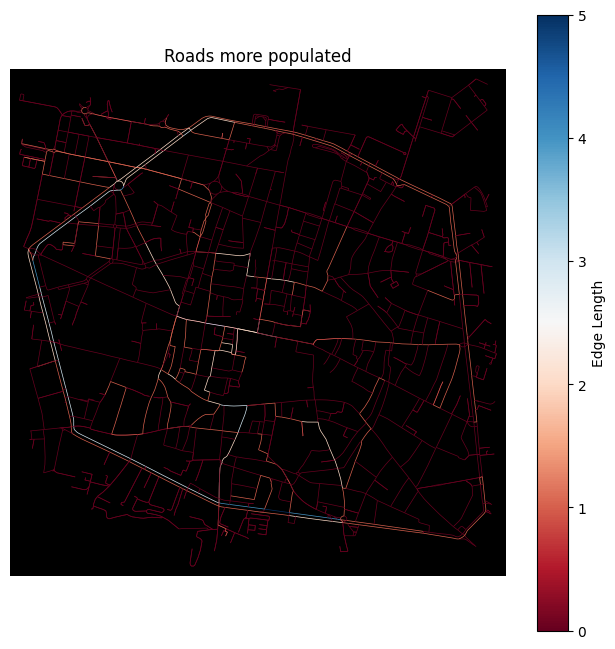


Maximum space traveled : 1300.0m (taking Bologna diameter 2600m)
Velocity respect to 50 Km/h is 18.840579710144926 faster 

Animation finished. Video processing ...


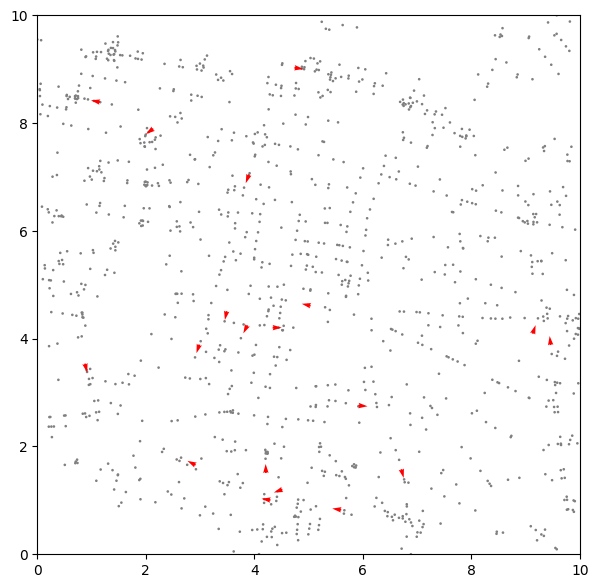

In [284]:
nodes,edges = simulation_cars(G,
                n_cars = 20,
                radius = Bologna_radius,
                max_speed = 1,
                size = 10,
                scale = 0.3,
                turn_range = 0.04, 
                dt = 0.05,
                n_time_steps = 100,
                map = True, 
                animate=True)